<a href="https://colab.research.google.com/github/bhgtankita/MYWORK/blob/master/CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
!ls

gdrive	sample_data


In [2]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-dq2wtxze
  Running command git clone -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-dq2wtxze
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-cp36-none-any.whl size=101066 sha256=a96f27b0973f4e1a584b44036a2d2cfce037f2d17804abfb2fbc37570ade7894
  Stored in directory: /tmp/pip-ephem-wheel-cache-879_kvmb/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


In [14]:
from keras.preprocessing.image import ImageDataGenerator
import scipy
from glob import glob
import numpy as np
import os


class DataLoader:
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, domain, batch_size=1, is_testing=False):

        data_type = "train%s" % domain if not is_testing else "test%s" % domain
        path = glob('%s/%s/*' % (self.dataset_name, data_type))

        batch_images = np.random.choice(path, size=batch_size)

        imgs = []
        for img_path in batch_images:
            img = self.imread(img_path)
            if not is_testing:
                img = scipy.misc.imresize(img, self.img_res)

                if np.random.random() > 0.5:
                    img = np.fliplr(img)
            else:
                img = scipy.misc.imresize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs)/127.5 - 1.

        return imgs

    def load_k_data(self, domain, image_number=10, is_testing=False):
        data_type = "train%s" % domain if not is_testing else "test%s" % domain
        path = glob('%s/%s/*' % (self.dataset_name, data_type))

        images = np.array(path)
        if image_number < len(path):
            images = images[:image_number]

        imgs = []
        for img_path in images:
            img = self.imread(img_path)
            if not is_testing:
                img = scipy.misc.imresize(img, self.img_res)

                if np.random.random() > 0.5:
                    img = np.fliplr(img)
            else:
                img = scipy.misc.imresize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs) / 127.5 - 1.

        return imgs

    def load_batch(self, batch_size=1, is_testing=False, aug=False):
        data_type = "train" if not is_testing else "test"
 
        path_A = glob('%s/%sA/*' % (self.dataset_name, data_type))
        path_B = glob('%s/%sB/*' % (self.dataset_name, data_type))

        if not is_testing and aug:
            datagen = ImageDataGenerator(
                zoom_range=0.2,
                rotation_range=15,
                width_shift_range=0.1,
                height_shift_range=0.1,
                horizontal_flip=True,
                brightness_range=[0.5, 1.5]
            )

        self.n_batches = int(min(len(path_A), len(path_B)) / batch_size)
        total_samples = self.n_batches * batch_size

        # Sample n_batches * batch_size from each path list so that model sees all
        # samples from both domains
        path_A = np.random.choice(path_A, total_samples, replace=False)
        path_B = np.random.choice(path_B, total_samples, replace=False)

        for i in range(self.n_batches-1):
            batch_A = path_A[i*batch_size:(i+1)*batch_size]
            batch_B = path_B[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img_A, img_B in zip(batch_A, batch_B):
                img_A = self.imread(img_A)
                img_B = self.imread(img_B)

                img_A = scipy.misc.imresize(img_A, self.img_res)
                img_B = scipy.misc.imresize(img_B, self.img_res)

                # Data augmenting
                if not is_testing and aug:
                    img_A = datagen.random_transform(img_A)
                    img_B = datagen.random_transform(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def load_img(self, path):
        img = self.imread(path)
        img = scipy.misc.imresize(img, self.img_res)
        img = img/127.5 - 1.
        return img[np.newaxis, :, :, :]

    def imread(self, path):
        return scipy.misc.imread(path, mode='RGB').astype(np.float)

Using TensorFlow backend.


In [15]:
# Modified code based on user Akihiko solution: https://stackoverflow.com/questions/50677544/reflection-padding-conv2d

import tensorflow as tf
from keras.engine.topology import Layer
from keras.engine import InputSpec

from keras.models import Model
from keras.layers import Input, Conv2D


class ReflectionPadding2D(Layer):
    def __init__(self, padding, **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def compute_output_shape(self, input_shape):
        shape = (
            input_shape[0],
            input_shape[1] + 2 * self.padding[0],
            input_shape[2] + 2 * self.padding[1],
            input_shape[3]
        )
        return shape

    def call(self, x, mask=None):
        width_pad, height_pad = self.padding
        return tf.pad(
            x,
            [[0, 0], [height_pad, height_pad], [width_pad, width_pad], [0, 0]],
            'REFLECT'
        )


if __name__ == '__main__':
    # Example of use
    nn_input = Input((128, 128, 3))
    reflect_pad = ReflectionPadding2D(padding=(3, 3))(nn_input)
    conv2d = Conv2D(32, kernel_size=7, strides=1, padding="valid")(reflect_pad)
    model = Model(nn_input, conv2d)
    model.summary()

W0818 13:26:20.695309 140381417695104 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0818 13:26:20.722322 140381417695104 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0818 13:26:20.730857 140381417695104 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
reflection_padding2d_1 (Refl (None, 134, 134, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 32)      4736      
Total params: 4,736
Trainable params: 4,736
Non-trainable params: 0
_________________________________________________________________


#Dataset

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
from shutil import copyfile
copyfile("gdrive/My Drive/face_dataset.zip","face_dataset.zip")

'face_dataset.zip'

In [0]:
!ls

face_dataset.zip  gdrive  sample_data


In [0]:
!unzip -q face_dataset.zip

In [0]:
!ls face_dataset

test_old  test_young  train_old  train_young


In [0]:
!mv face_dataset/train_young face_dataset/trainA
!mv face_dataset/train_old face_dataset/trainB
!mv face_dataset/test_young face_dataset/testA
!mv face_dataset/test_old face_dataset/testB

In [0]:
!ls face_dataset

testA  testB  trainA  trainB


In [4]:
!pip install scipy==1.1.0

     |████████████████████████████████| 31.2MB 1.7MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scipy 1.3.1
    Uninstalling scipy-1.3.1:
      Successfully uninstalled scipy-1.3.1


In [0]:
!mkdir models
!mkdir images
!mkdir test_images

In [0]:
from __future__ import print_function, division

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dropout, Activation, Add
from keras.layers import Dense, Lambda, Flatten, Reshape
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import datetime
import matplotlib.pyplot as plt
import scipy.misc



class CycleGAN:
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'face_dataset'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2 ** 4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Loss weights
        self.lambda_cycle = 10.0  # Cycle-consistency loss
        self.lambda_id = 0.1 * self.lambda_cycle  # Identity loss

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])
        self.d_B.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])

        # -------------------------
        # Construct Computational
        #   Graph of Generators
        # -------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[valid_A, valid_B,
                                       reconstr_A, reconstr_B,
                                       img_A_id, img_B_id])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              loss_weights=[1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id],
                              optimizer=optimizer)

        self.current_epoch = 0

    def build_generator(self):
        def conv2d(layer_input, filters, f_size=4, stride=2, padding='valid'):
            d = Conv2D(filters, kernel_size=f_size, strides=stride, padding=padding)(layer_input)
            d = InstanceNormalization()(d)
            d = Activation('relu')(d)
            return d

        def res_block(layer_input, filters=256, use_dropout=False):
            y = ReflectionPadding2D(padding=(1, 1))(layer_input)
            y = conv2d(y, filters, 3, 1)
            if use_dropout:
                y = Dropout(0.5)(y)
            y = ReflectionPadding2D(padding=(1, 1))(y)
            y = conv2d(y, filters, 3, 1)
            return Add()([y, layer_input])

        def deconv2d(layer_input, filters, f_size=4, dropout_rate=0):
            u = Conv2DTranspose(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Activation('relu')(u)
            return u

        # Image input
        d0 = Input(shape=self.img_shape)
        d1 = ReflectionPadding2D(padding=(3, 3))(d0)
        # c7s1-64
        d1 = conv2d(d1, self.gf, 7, 1)
        # d128
        d2 = conv2d(d1, self.gf * 2, 3, padding='same')
        # d256
        d3 = conv2d(d2, self.gf * 4, 3, padding='same')
        # R256,R256,R256,R256,R256,R256
        r = res_block(d3)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        # u128
        u1 = deconv2d(r, self.gf * 2, 3)
        # u64
        u2 = deconv2d(u1, self.gf, 3)
        # c7s1-3
        u3 = ReflectionPadding2D(padding=(3, 3))(u2)
        output_img = Conv2D(self.channels, kernel_size=7, strides=1, activation='tanh')(u3)

        return Model(d0, output_img)

    def build_discriminator(self):
        def d_layer(layer_input, filters, f_size=4, normalization=True):
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if normalization:
                d = InstanceNormalization()(d)
            d = LeakyReLU(alpha=0.2)(d)
            return d

        img = Input(shape=self.img_shape)
        # C64-C128-C256-C512
        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df * 2)
        d3 = d_layer(d2, self.df * 4)
        d4 = d_layer(d3, self.df * 8)
        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def load_network(self, n_epoch_start):
        # returns a compiled model identical to the previous one
        self.current_epoch = n_epoch_start+1
#         self.combined.load_weights("models/combined_ep{}.h5".format(self.dataset_name, n_epoch_start))
        self.combined.load_weights("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(self.dataset_name, n_epoch_start))

    def train(self, epochs, batch_size=1, sample_interval=50):
        start_time = datetime.datetime.now()
#         print(start_time)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size, aug=True)):
                # ----------------------
                #  Train Discriminators
                # ----------------------
                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)
                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                      [valid, valid,
                                                       imgs_A, imgs_B,
                                                       imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print(
                    "[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                    % (epoch, epochs,
                       batch_i, self.data_loader.n_batches,
                       d_loss[0], 100 * d_loss[1],
                       g_loss[0],
                       np.mean(g_loss[1:3]),
                       np.mean(g_loss[3:5]),
                       np.mean(g_loss[5:6]),
                       elapsed_time))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch+self.current_epoch, batch_i)

            if epoch % 10 == 0 and (epoch != 0 or self.current_epoch != 0):
                self.combined.save("models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )
                self.combined.save("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )

    def sample_images(self, epoch, batch_i):
        r, c = 2, 3
        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)
        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i, j].axis('off')
                cnt += 1

        fig.savefig("images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        fig.savefig("gdrive/My Drive/face/images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        plt.close()

    def test_k_images(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}.png".format(self.dataset_name, image_i))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}.png".format(self.dataset_name, image_i))
            plt.close()

    def test_k_images_epoch(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            plt.close()

In [0]:
!mkdir images/face_dataset_paper

In [0]:
!ls images	      

face_dataset_paper


In [0]:
cyclegan = CycleGAN()
cyclegan.train(epochs=150, batch_size=16, sample_interval=200)

W0804 14:22:23.856317 140568840984448 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



2019-08-04 14:22:27.050896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
W0804 14:22:27.311188 140568840984448 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:2741: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

W0804 14:22:27.315481 140568840984448 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/ke

[Epoch 0/150] [Batch 0/240] [D loss: 13.174069, acc:   3%] [G loss: 67.888069, adv: 26.480576, recon: 0.680574, id: 0.628845] time: 0:00:48.031563 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/150] [Batch 1/240] [D loss: 21.125013, acc:   1%] [G loss: 17.468397, adv: 1.190979, recon: 0.688303, id: 0.664953] time: 0:00:51.475788 
[Epoch 0/150] [Batch 2/240] [D loss: 5.906127, acc:   3%] [G loss: 15.743944, adv: 1.035121, recon: 0.622756, id: 0.609932] time: 0:00:53.747883 
[Epoch 0/150] [Batch 3/240] [D loss: 1.367177, acc:  35%] [G loss: 15.623738, adv: 1.655257, recon: 0.560156, id: 0.509000] time: 0:00:56.021703 
[Epoch 0/150] [Batch 4/240] [D loss: 0.776903, acc:  38%] [G loss: 12.758603, adv: 0.732057, recon: 0.513452, id: 0.517698] time: 0:00:58.300608 
[Epoch 0/150] [Batch 5/240] [D loss: 0.786669, acc:  40%] [G loss: 12.584330, adv: 0.706918, recon: 0.507615, id: 0.471197] time: 0:01:00.583043 
[Epoch 0/150] [Batch 6/240] [D loss: 0.239461, acc:  66%] [G loss: 13.321580, adv: 1.048108, recon: 0.509781, id: 0.530563] time: 0:01:02.853881 
[Epoch 0/150] [Batch 7/240] [D loss: 0.255779, acc:  60%] [G loss: 11.655116, adv: 0.878584, recon: 0.449203, id: 0.460582]

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=74)
cyclegan.train(epochs=50, batch_size=16, sample_interval=200)

2019-08-05 08:00:48.018256


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/50] [Batch 0/240] [D loss: 0.235318, acc:  57%] [G loss: 1.379501, adv: 0.346619, recon: 0.028935, id: 0.053299] time: 0:00:51.281637 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/50] [Batch 1/240] [D loss: 0.237618, acc:  58%] [G loss: 2.409352, adv: 0.348249, recon: 0.079270, id: 0.060951] time: 0:00:53.801969 
[Epoch 0/50] [Batch 2/240] [D loss: 0.250288, acc:  56%] [G loss: 1.982625, adv: 0.355748, recon: 0.058134, id: 0.048084] time: 0:00:56.092109 
[Epoch 0/50] [Batch 3/240] [D loss: 0.223545, acc:  63%] [G loss: 2.467967, adv: 0.403517, recon: 0.076657, id: 0.075070] time: 0:00:58.378624 
[Epoch 0/50] [Batch 4/240] [D loss: 0.227034, acc:  61%] [G loss: 2.452038, adv: 0.412650, recon: 0.075111, id: 0.056113] time: 0:01:00.667225 
[Epoch 0/50] [Batch 5/240] [D loss: 0.207240, acc:  67%] [G loss: 2.098729, adv: 0.440474, recon: 0.055693, id: 0.057470] time: 0:01:02.961263 
[Epoch 0/50] [Batch 6/240] [D loss: 0.241651, acc:  60%] [G loss: 2.449097, adv: 0.412373, recon: 0.075582, id: 0.052220] time: 0:01:05.258404 
[Epoch 0/50] [Batch 7/240] [D loss: 0.277206, acc:  48%] [G loss: 1.979926, adv: 0.385527, recon: 0.055261, id: 0.056645] time: 0:01:07.

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=126)
cyclegan.train(epochs=30, batch_size=16, sample_interval=200)

W0805 17:16:05.837003 140630675335040 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0805 17:16:05.841968 140630675335040 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



2019-08-05 17:16:11.951376


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/30] [Batch 0/240] [D loss: 0.292656, acc:  46%] [G loss: 1.652935, adv: 0.307804, recon: 0.046310, id: 0.054252] time: 0:00:49.550309 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/30] [Batch 1/240] [D loss: 0.219267, acc:  63%] [G loss: 2.063960, adv: 0.356793, recon: 0.062117, id: 0.058907] time: 0:00:56.417021 
[Epoch 0/30] [Batch 2/240] [D loss: 0.226879, acc:  61%] [G loss: 2.109359, adv: 0.382205, recon: 0.062055, id: 0.043505] time: 0:00:58.759342 
[Epoch 0/30] [Batch 3/240] [D loss: 0.207346, acc:  66%] [G loss: 2.340765, adv: 0.417592, recon: 0.069668, id: 0.059118] time: 0:01:01.109862 
[Epoch 0/30] [Batch 4/240] [D loss: 0.283401, acc:  49%] [G loss: 1.990547, adv: 0.371219, recon: 0.056502, id: 0.059760] time: 0:01:03.467712 
[Epoch 0/30] [Batch 5/240] [D loss: 0.212912, acc:  64%] [G loss: 2.010630, adv: 0.430286, recon: 0.052356, id: 0.050762] time: 0:01:05.829062 
[Epoch 0/30] [Batch 6/240] [D loss: 0.198360, acc:  70%] [G loss: 2.021876, adv: 0.457356, recon: 0.049990, id: 0.050824] time: 0:01:08.191993 
[Epoch 0/30] [Batch 7/240] [D loss: 0.232014, acc:  60%] [G loss: 1.994617, adv: 0.423942, recon: 0.052010, id: 0.056715] time: 0:01:10.

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=147)
cyclegan.train(epochs=50, batch_size=8, sample_interval=200)

2019-08-06 14:54:15.064326


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/50] [Batch 0/481] [D loss: 0.253596, acc:  55%] [G loss: 1.282337, adv: 0.335504, recon: 0.025493, id: 0.050820] time: 0:02:01.661604 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/50] [Batch 1/481] [D loss: 0.254698, acc:  59%] [G loss: 2.266115, adv: 0.353189, recon: 0.071538, id: 0.064814] time: 0:02:05.554897 
[Epoch 0/50] [Batch 2/481] [D loss: 0.249801, acc:  55%] [G loss: 1.704561, adv: 0.352107, recon: 0.043582, id: 0.067244] time: 0:02:08.416599 
[Epoch 0/50] [Batch 3/481] [D loss: 0.185795, acc:  69%] [G loss: 2.466366, adv: 0.464326, recon: 0.070900, id: 0.055681] time: 0:02:11.293968 
[Epoch 0/50] [Batch 4/481] [D loss: 0.252096, acc:  61%] [G loss: 2.062317, adv: 0.413428, recon: 0.055985, id: 0.060696] time: 0:02:14.166312 
[Epoch 0/50] [Batch 5/481] [D loss: 0.210281, acc:  66%] [G loss: 2.109786, adv: 0.438697, recon: 0.056219, id: 0.053505] time: 0:02:17.041590 
[Epoch 0/50] [Batch 6/481] [D loss: 0.252864, acc:  52%] [G loss: 2.431533, adv: 0.421590, recon: 0.072985, id: 0.080752] time: 0:02:19.914961 
[Epoch 0/50] [Batch 7/481] [D loss: 0.225404, acc:  58%] [G loss: 2.642289, adv: 0.421596, recon: 0.083637, id: 0.042729] time: 0:02:22.

KeyboardInterrupt: ignored

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=148)
cyclegan.train(epochs=50, batch_size=8, sample_interval=200)

2019-08-08 05:27:28.748884


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/50] [Batch 0/481] [D loss: 0.260533, acc:  53%] [G loss: 1.332766, adv: 0.314576, recon: 0.029761, id: 0.058677] time: 0:01:03.647217 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/50] [Batch 1/481] [D loss: 0.267153, acc:  49%] [G loss: 2.260319, adv: 0.324737, recon: 0.073886, id: 0.069617] time: 0:01:12.274263 
[Epoch 0/50] [Batch 2/481] [D loss: 0.211081, acc:  68%] [G loss: 1.982453, adv: 0.378025, recon: 0.055953, id: 0.055193] time: 0:01:14.948458 
[Epoch 0/50] [Batch 3/481] [D loss: 0.150432, acc:  88%] [G loss: 2.075794, adv: 0.474798, recon: 0.051527, id: 0.043211] time: 0:01:17.614270 
[Epoch 0/50] [Batch 4/481] [D loss: 0.165279, acc:  82%] [G loss: 2.332292, adv: 0.448964, recon: 0.066730, id: 0.051975] time: 0:01:20.279082 
[Epoch 0/50] [Batch 5/481] [D loss: 0.254029, acc:  62%] [G loss: 2.225494, adv: 0.416162, recon: 0.063869, id: 0.075311] time: 0:01:22.972936 
[Epoch 0/50] [Batch 6/481] [D loss: 0.237763, acc:  58%] [G loss: 1.759851, adv: 0.398723, recon: 0.042682, id: 0.057550] time: 0:01:25.637433 
[Epoch 0/50] [Batch 7/481] [D loss: 0.252212, acc:  59%] [G loss: 1.802124, adv: 0.424961, recon: 0.041225, id: 0.064962] time: 0:01:28.

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=169)
cyclegan.train(epochs=31, batch_size=8, sample_interval=200)

W0808 17:23:50.603976 140336749090688 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0808 17:23:59.168345 140336749090688 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0808 17:23:59.179397 140336749090688 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: Deprecat

[Epoch 0/31] [Batch 0/481] [D loss: 0.257310, acc:  50%] [G loss: 1.232000, adv: 0.328095, recon: 0.023602, id: 0.056832] time: 0:00:59.316247 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/31] [Batch 1/481] [D loss: 0.232254, acc:  60%] [G loss: 1.929541, adv: 0.341989, recon: 0.056712, id: 0.052254] time: 0:01:08.760597 
[Epoch 0/31] [Batch 2/481] [D loss: 0.199504, acc:  67%] [G loss: 1.707206, adv: 0.404510, recon: 0.039644, id: 0.053441] time: 0:01:11.590338 
[Epoch 0/31] [Batch 3/481] [D loss: 0.243446, acc:  58%] [G loss: 2.153930, adv: 0.348354, recon: 0.066255, id: 0.059742] time: 0:01:14.444148 
[Epoch 0/31] [Batch 4/481] [D loss: 0.200600, acc:  66%] [G loss: 1.909709, adv: 0.422616, recon: 0.048023, id: 0.054646] time: 0:01:17.277957 
[Epoch 0/31] [Batch 5/481] [D loss: 0.304961, acc:  40%] [G loss: 1.714382, adv: 0.308350, recon: 0.048998, id: 0.066235] time: 0:01:20.105743 
[Epoch 0/31] [Batch 6/481] [D loss: 0.247063, acc:  52%] [G loss: 1.648153, adv: 0.368691, recon: 0.040589, id: 0.049054] time: 0:01:22.940803 
[Epoch 0/31] [Batch 7/481] [D loss: 0.253368, acc:  57%] [G loss: 1.733702, adv: 0.373899, recon: 0.044181, id: 0.045871] time: 0:01:25.

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=180)
cyclegan.train(epochs=20, batch_size=8, sample_interval=200)

W0809 10:19:18.562563 139793916413824 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0809 10:19:26.776265 139793916413824 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0809 10:19:26.777589 139793916413824 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: Deprecat

[Epoch 0/20] [Batch 0/481] [D loss: 0.275838, acc:  50%] [G loss: 1.189594, adv: 0.315061, recon: 0.023284, id: 0.050103] time: 0:00:51.953092 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/20] [Batch 1/481] [D loss: 0.181955, acc:  75%] [G loss: 2.053554, adv: 0.413265, recon: 0.056545, id: 0.038963] time: 0:01:01.633416 
[Epoch 0/20] [Batch 2/481] [D loss: 0.180568, acc:  73%] [G loss: 2.272876, adv: 0.431129, recon: 0.065509, id: 0.053011] time: 0:01:04.490029 
[Epoch 0/20] [Batch 3/481] [D loss: 0.269335, acc:  53%] [G loss: 1.568978, adv: 0.326037, recon: 0.041126, id: 0.055543] time: 0:01:07.326758 
[Epoch 0/20] [Batch 4/481] [D loss: 0.280223, acc:  45%] [G loss: 1.907200, adv: 0.319945, recon: 0.057606, id: 0.046929] time: 0:01:10.176548 
[Epoch 0/20] [Batch 5/481] [D loss: 0.218144, acc:  61%] [G loss: 1.712161, adv: 0.405131, recon: 0.039825, id: 0.053950] time: 0:01:13.042192 
[Epoch 0/20] [Batch 6/481] [D loss: 0.218080, acc:  63%] [G loss: 1.840115, adv: 0.408801, recon: 0.046401, id: 0.043412] time: 0:01:15.880147 
[Epoch 0/20] [Batch 7/481] [D loss: 0.216046, acc:  62%] [G loss: 1.571230, adv: 0.436742, recon: 0.029555, id: 0.041460] time: 0:01:18.

KeyboardInterrupt: ignored

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=191)
cyclegan.train(epochs=20, batch_size=8, sample_interval=200)

W0810 10:13:43.750838 140236315944832 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0810 10:13:50.443484 140236315944832 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0810 10:13:50.445065 140236315944832 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: Deprecat

[Epoch 0/20] [Batch 0/481] [D loss: 0.269640, acc:  51%] [G loss: 1.199057, adv: 0.313707, recon: 0.023575, id: 0.047036] time: 0:00:51.637126 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/20] [Batch 1/481] [D loss: 0.260428, acc:  51%] [G loss: 1.988320, adv: 0.310531, recon: 0.063085, id: 0.049852] time: 0:01:00.299340 
[Epoch 0/20] [Batch 2/481] [D loss: 0.256926, acc:  50%] [G loss: 1.463579, adv: 0.327379, recon: 0.036876, id: 0.031987] time: 0:01:03.040293 
[Epoch 0/20] [Batch 3/481] [D loss: 0.227482, acc:  64%] [G loss: 1.953647, adv: 0.378097, recon: 0.055461, id: 0.035429] time: 0:01:05.781345 
[Epoch 0/20] [Batch 4/481] [D loss: 0.183309, acc:  77%] [G loss: 1.744744, adv: 0.440851, recon: 0.039325, id: 0.043439] time: 0:01:08.542810 
[Epoch 0/20] [Batch 5/481] [D loss: 0.223459, acc:  60%] [G loss: 1.624326, adv: 0.384871, recon: 0.037098, id: 0.043774] time: 0:01:11.293013 
[Epoch 0/20] [Batch 6/481] [D loss: 0.219892, acc:  68%] [G loss: 1.887951, adv: 0.414280, recon: 0.046910, id: 0.064613] time: 0:01:14.038536 
[Epoch 0/20] [Batch 7/481] [D loss: 0.262804, acc:  49%] [G loss: 1.761984, adv: 0.372460, recon: 0.045023, id: 0.059823] time: 0:01:16.

KeyboardInterrupt: ignored

# Extra

In [0]:
!ls

face_dataset	  gdrive  models       test_images
face_dataset.zip  images  sample_data


In [0]:
from __future__ import print_function, division

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dropout, Activation, Add
from keras.layers import Dense, Lambda, Flatten, Reshape
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import datetime
import matplotlib.pyplot as plt
import scipy.misc
# from data_loader import DataLoader
# from reflection_padding import ReflectionPadding2D
from sklearn import manifold
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

class CycleGAN:
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'face_dataset'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2 ** 4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Loss weights
        self.lambda_cycle = 10.0  # Cycle-consistency loss
        self.lambda_id = 0.1 * self.lambda_cycle  # Identity loss

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])
        self.d_B.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])

        # -------------------------
        # Construct Computational
        #   Graph of Generators
        # -------------------------

        # Build the generators
        self.g_AB, self.encoder_AB, self.ltspace = self.build_generator()
        self.g_BA, self.encoder_BA, self.ltspace = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[valid_A, valid_B,
                                       reconstr_A, reconstr_B,
                                       img_A_id, img_B_id])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              loss_weights=[1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id],
                              optimizer=optimizer)

        self.current_epoch = 0

    def build_generator(self):
        def conv2d(layer_input, filters, f_size=4, stride=2, padding='valid'):
            d = Conv2D(filters, kernel_size=f_size, strides=stride, padding=padding)(layer_input)
            d = InstanceNormalization()(d)
            d = Activation('relu')(d)
            return d

        def res_block(layer_input, filters=256, use_dropout=False):
            y = ReflectionPadding2D(padding=(1, 1))(layer_input)
            y = conv2d(y, filters, 3, 1)
            if use_dropout:
                y = Dropout(0.5)(y)
            y = ReflectionPadding2D(padding=(1, 1))(y)
            y = conv2d(y, filters, 3, 1)
            return Add()([y, layer_input])

        def deconv2d(layer_input, filters, f_size=4, dropout_rate=0):
            u = Conv2DTranspose(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Activation('relu')(u)
            return u

        # Image input
        d0 = Input(shape=self.img_shape)
        d1 = ReflectionPadding2D(padding=(3, 3))(d0)
        # c7s1-64
        d1 = conv2d(d1, self.gf, 7, 1)
        # d128
        d2 = conv2d(d1, self.gf * 2, 3, padding='same')
        # d256
        d3 = conv2d(d2, self.gf * 4, 3, padding='same')
        # R256,R256,R256,R256,R256,R256
        r = res_block(d3)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)  #### (?, 32, 32, 256)
        # u128
        u1 = deconv2d(r, self.gf * 2, 3)
        # u64
        u2 = deconv2d(u1, self.gf, 3)
        # c7s1-3
        u3 = ReflectionPadding2D(padding=(3, 3))(u2)
        output_img = Conv2D(self.channels, kernel_size=7, strides=1, activation='tanh')(u3)
        
        
        # Latent space // bottleneck layer
#         x = Flatten()(r)
        x = Flatten()(d3)
        x = Dense(128)(x)
        z = Activation('relu')(x)

        ##### MODEL 1: ENCODER #####
        encoder = Model(d0, z)
        ltspace = Model(d0, r)
        return Model(d0, output_img), encoder, ltspace
      
#         pca = PCA(n_components=2)
#         pca.fit(r)
#         pca_result = pca.transform(r)

#         print(pca_result.shape)
#         return Model(d0, pca_result)
#         return Model(d0, r)


#         return Model(d0, output_img)

    def build_discriminator(self):
        def d_layer(layer_input, filters, f_size=4, normalization=True):
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if normalization:
                d = InstanceNormalization()(d)
            d = LeakyReLU(alpha=0.2)(d)
            return d

        img = Input(shape=self.img_shape)
        # C64-C128-C256-C512
        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df * 2)
        d3 = d_layer(d2, self.df * 4)
        d4 = d_layer(d3, self.df * 8)
        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def load_network(self, n_epoch_start):
        # returns a compiled model identical to the previous one
        self.current_epoch = n_epoch_start+1
#         self.combined.load_weights("models/combined_ep{}.h5".format(self.dataset_name, n_epoch_start))
        self.combined.load_weights("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(self.dataset_name, n_epoch_start))

    def train(self, epochs, batch_size=1, sample_interval=50):
        start_time = datetime.datetime.now()
#         print(start_time)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size, aug=True)):
                # ----------------------
                #  Train Discriminators
                # ----------------------
                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)
                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                      [valid, valid,
                                                       imgs_A, imgs_B,
                                                       imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print(
                    "[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                    % (epoch, epochs,
                       batch_i, self.data_loader.n_batches,
                       d_loss[0], 100 * d_loss[1],
                       g_loss[0],
                       np.mean(g_loss[1:3]),
                       np.mean(g_loss[3:5]),
                       np.mean(g_loss[5:6]),
                       elapsed_time))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch+self.current_epoch, batch_i)

            if epoch % 10 == 0 and (epoch != 0 or self.current_epoch != 0):
                self.combined.save("models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )
                self.combined.save("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )

    def sample_images(self, epoch, batch_i):
        r, c = 2, 3
        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)
        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i, j].axis('off')
                cnt += 1

        fig.savefig("images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        fig.savefig("gdrive/My Drive/face/images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        plt.close()

    def test_k_images(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}.png".format(self.dataset_name, image_i))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}.png".format(self.dataset_name, image_i))
            plt.close()

    def test_k_images_epoch(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            plt.close()

    def test_k_images_test(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}.png".format(self.dataset_name, image_i))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}.png".format(self.dataset_name, image_i))
            plt.close()

    # Scatter with images instead of points
    def imscatter(self, x, y, ax, imageData, zoom):
        images = []
        for i in range(len(x)):
            x0, y0 = x[i], y[i]
#             print(x0)
#             print(y0)
            # Convert to image
            img = imageData[i]*255.
            img = img.astype(np.uint8).reshape([128,128,3])
#             img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
            # Note: OpenCV uses BGR and plt uses RGB
            image = OffsetImage(img, zoom=zoom)
            ab = AnnotationBbox(image, (x0, y0), xycoords='data', frameon=False)
            images.append(ax.add_artist(ab))

        ax.update_datalim(np.column_stack([x, y]))
        ax.autoscale()            
            
    # Show dataset images with T-sne projection of latent space encoding
    def computeTSNEProjectionOfLatentSpace(self, image_number=25):
        # Compute latent space representation
        display=True

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=3, is_testing=True)
#         imgs_A = self.data_loader.load_data(domain="A", is_testing=True)
#         imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)
        print(imgs_A.shape)
        print("Computing latent space projection...")
        X_encoded = self.encoder_AB.predict(imgs_A)
        print(X_encoded.shape)
        # Compute t-SNE embedding of latent space
        print("Computing t-SNE embedding...")
        tsne = manifold.TSNE(n_components=3, init='pca', random_state=0)
        X_tsne = tsne.fit_transform(X_encoded)
        print(X_tsne[:, 0].shape)

        # Plot images according to t-sne embedding
        if display:
            print("Plotting t-SNE visualization...")
            fig, ax = plt.subplots()
            self.imscatter(X_tsne[:, 0], X_tsne[:, 1], imageData=imgs_A, ax=ax, zoom=0.6)
            plt.show()
        else:
            return X_tsne
          
    # Computes A, B, C, A+B, A+B-C in latent space
    def visualizeArithmetics(a, b, c, encoder, decoder):
        print("Computing arithmetics...")
        # Create micro batch
        X = np.array([a,b,c])

        # Compute latent space projection
        latentA, latentB, latentC = encoder.predict(X)

        add = latentA+latentB
        addSub = latentA+latentB-latentC

        # Create micro batch
        X = np.array([latentA,latentB,latentC,add,addSub])

        # Compute reconstruction
        reconstructedA, reconstructedB, reconstructedC, reconstructedAdd, reconstructedAddSub = decoder.predict(X)

        cv2.imshow("Arithmetics in latent space",np.hstack([reconstructedA, reconstructedB, reconstructedC, reconstructedAdd, reconstructedAddSub]))
        cv2.waitKey()

    # Shows linear inteprolation in image space vs latent space
    def visualizeInterpolation(start, end, encoder, decoder, save=False, nbSteps=5):
        print("Generating interpolations...")

        # Create micro batch
        X = np.array([start,end])

        # Compute latent space projection
        latentX = encoder.predict(X)
        latentStart, latentEnd = latentX

        # Get original image for comparison
        startImage, endImage = X

        vectors = []
        normalImages = []
        #Linear interpolation
        alphaValues = np.linspace(0, 1, nbSteps)
        for alpha in alphaValues:
            # Latent space interpolation
            vector = latentStart*(1-alpha) + latentEnd*alpha
            vectors.append(vector)
            # Image space interpolation
            blendImage = cv2.addWeighted(startImage,1-alpha,endImage,alpha,0)
            normalImages.append(blendImage)

        # Decode latent space vectors
        vectors = np.array(vectors)
        reconstructions = decoder.predict(vectors)

        # Put final image together
        resultLatent = None
        resultImage = None

        if save:
            hashName = ''.join(random.choice(string.lowercase) for i in range(3))

        for i in range(len(reconstructions)):
            interpolatedImage = normalImages[i]*255
            interpolatedImage = cv2.resize(interpolatedImage,(50,50))
            interpolatedImage = interpolatedImage.astype(np.uint8)
            resultImage = interpolatedImage if resultImage is None else np.hstack([resultImage,interpolatedImage])

            reconstructedImage = reconstructions[i]*255.
            reconstructedImage = reconstructedImage.reshape([28,28])
            reconstructedImage = cv2.resize(reconstructedImage,(50,50))
            reconstructedImage = reconstructedImage.astype(np.uint8)
            resultLatent = reconstructedImage if resultLatent is None else np.hstack([resultLatent,reconstructedImage])

            if save:
                cv2.imwrite(visualsPath+"{}_{}.png".format(hashName,i),np.hstack([interpolatedImage,reconstructedImage]))

            result = np.vstack([resultImage,resultLatent])

        if not save:
            cv2.imshow("Interpolation in Image Space vs Latent Space",result)
            cv2.waitKey()
            cv2.destroyAllWindows()   
            
    def sample_visualization(self):
        r, c = 5, 5

        img_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        print(img_A.shape)
        X_encoded = self.ltspace.predict(img_A)
        print(X_encoded.shape)
        print(X_encoded[0, :, :, 4].shape)
#         plt.imshow(X_encoded[0, :, :, 0])
        
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(X_encoded[0, :, :, cnt])
#                 axs[i, j].set_title(titles[j])
                axs[i, j].axis('off')
                cnt += 1
        
    def computeTSNEProjectionOfdata(self, image_number=25):
        imgs_A = self.data_loader.load_k_data(domain="A", image_number=10000, is_testing=True)
        gen_imgs = 0.5 * imgs_A + 0.5
        print(gen_imgs.shape)
        tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
        X_tsne = tsne.fit_transform(gen_imgs)
        tsne_data = pd.DataFrame(data=X_tsne, columns=("Dim_1","Dim_2"))
        sn.FacetGrid(data=tsne_data).map(plt.scatter, 'Dim_1', 'Dim_2')
        plt.show()
#         # Compute latent space representation
#         display=True

#         imgs_A = self.data_loader.load_k_data(domain="A", image_number=1000, is_testing=True)
# #         imgs_A = self.data_loader.load_data(domain="A", is_testing=True)
# #         imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)
#         print(imgs_A.shape)

#         tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
#         X_tsne = tsne.fit_transform(imgs_A.reshape([-1,128*128*3]))
#         print(X_tsne[:, 0].shape)

#         # Plot images according to t-sne embedding
#         if display:
#             print("Plotting t-SNE visualization...")
#             fig, ax = plt.subplots()
#             self.imscatter(X_tsne[:, 0], X_tsne[:, 1], imageData=imgs_A, ax=ax, zoom=0.6)
#             plt.show()
#         else:
#             return X_tsne        

In [0]:
cyclegan = CycleGAN()

In [0]:
cyclegan.computeTSNEProjectionOfdata()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(1401, 128, 128, 3)


ValueError: ignored

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=195)
cyclegan.train(epochs=1, batch_size=4, sample_interval=200)

W0815 01:38:41.359793 139630585051008 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0815 01:38:41.361355 139630585051008 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationW

[Epoch 0/1] [Batch 0/963] [D loss: 0.228566, acc:  65%] [G loss: 1.402219, adv: 0.351274, recon: 0.029626, id: 0.065997] time: 0:00:51.851190 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/1] [Batch 1/963] [D loss: 0.258069, acc:  54%] [G loss: 1.584124, adv: 0.314218, recon: 0.042388, id: 0.039221] time: 0:00:54.811389 
[Epoch 0/1] [Batch 2/963] [D loss: 0.213308, acc:  65%] [G loss: 1.476408, adv: 0.383285, recon: 0.030945, id: 0.055978] time: 0:00:56.488802 
[Epoch 0/1] [Batch 3/963] [D loss: 0.258659, acc:  56%] [G loss: 1.789985, adv: 0.355379, recon: 0.048343, id: 0.054413] time: 0:00:58.164498 
[Epoch 0/1] [Batch 4/963] [D loss: 0.226238, acc:  60%] [G loss: 1.537601, adv: 0.377745, recon: 0.034379, id: 0.055345] time: 0:00:59.868625 
[Epoch 0/1] [Batch 5/963] [D loss: 0.231779, acc:  57%] [G loss: 1.674211, adv: 0.377503, recon: 0.041719, id: 0.039462] time: 0:01:01.547631 
[Epoch 0/1] [Batch 6/963] [D loss: 0.276807, acc:  39%] [G loss: 1.550288, adv: 0.343480, recon: 0.039827, id: 0.034514] time: 0:01:03.233042 
[Epoch 0/1] [Batch 7/963] [D loss: 0.241861, acc:  58%] [G loss: 1.482773, adv: 0.375527, recon: 0.032197, id: 0.041536] time: 0:01:04.915558 

KeyboardInterrupt: ignored

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(1, 128, 128, 3)
(1, 32, 32, 256)
(32, 32)


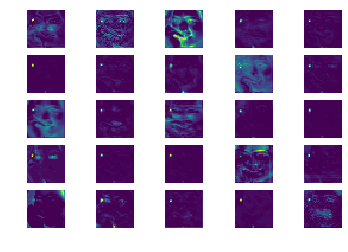

In [0]:
cyclegan.sample_visualization()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(1, 128, 128, 3)
(1, 32, 32, 256)
(32, 32)


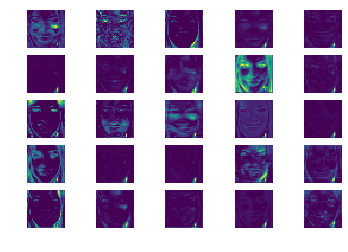

In [0]:
cyclegan.sample_visualization()

In [0]:
while 1 :cyclegan.visualizeArithmetics(X_test[randint(0,X_test.shape[0])], X_test[randint(0,X_test.shape[0])], X_test[randint(0,X_test.shape[0])], encoder, decoder)

NameError: ignored

In [0]:
import cv2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(3, 128, 128, 3)
(3,)
Plotting t-SNE visualization...


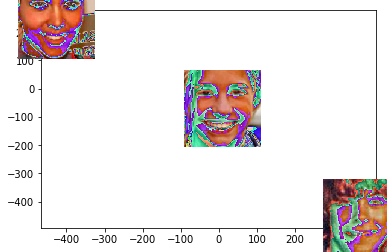

In [0]:
cyclegan.computeTSNEProjectionOfdata()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(3, 128, 128, 3)
Computing latent space projection...
(3, 128)
Computing t-SNE embedding...
(3,)
Plotting t-SNE visualization...


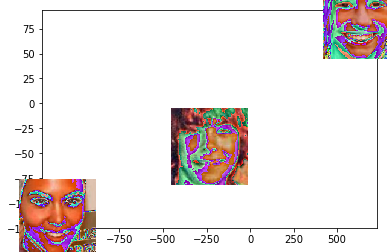

In [0]:
cyclegan.computeTSNEProjectionOfLatentSpace()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(3, 128, 128, 3)
Computing latent space projection...
(3, 128)
Computing t-SNE embedding...
(3,)
Plotting t-SNE visualization...


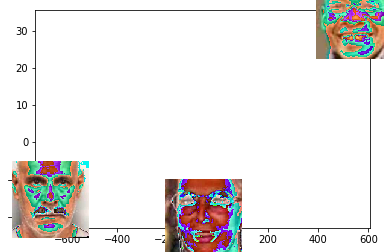

In [0]:
cyclegan.computeTSNEProjectionOfLatentSpace()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(3, 128, 128, 3)
Computing latent space projection...
(3, 32)
Computing t-SNE embedding...
(3,)
Plotting t-SNE visualization...


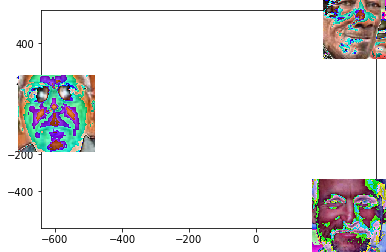

In [0]:
cyclegan.computeTSNEProjectionOfLatentSpace()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


(25, 128, 128, 3)
Computing latent space projection...
(25, 32)
Computing t-SNE embedding...
(25,)
Plotting t-SNE visualization...


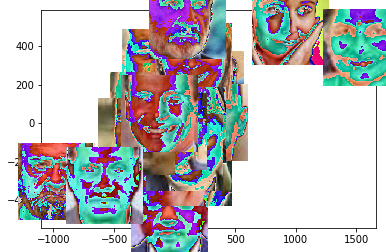

In [0]:
cyclegan.computeTSNEProjectionOfLatentSpace()

In [0]:
computeTSNEProjectionOfLatentSpace(X_test[:1000], encoder, display=True)

In [0]:
!ls

sample_data


In [0]:
# example of loading the generator model and generating images
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from keras.models import load_model
from matplotlib import pyplot
 
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=10):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	return z_input
 
# create a plot of generated images
def plot_generated(examples, n):
	# plot images
	for i in range(n * n):
		# define subplot
		pyplot.subplot(n, n, 1 + i)
		# turn off axis
		pyplot.axis('off')
		# plot raw pixel data
		pyplot.imshow(examples[i, :, :])
	pyplot.show()
 

  # load model
# model = load_model('gdrive/My Drive/face/models/combined_epface_dataset_148.h5')
# generate images
latent_points = generate_latent_points(100, 25)
# generate images
X  = model.predict(latent_points)
# scale from [-1,1] to [0,1]
X = (X + 1) / 2.0
# plot the result
plot_generated(X, 5)

ValueError: ignored

In [0]:
from __future__ import print_function, division

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dropout, Activation, Add
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import datetime
import matplotlib.pyplot as plt
import scipy.misc
# from data_loader import DataLoader
# from reflection_padding import ReflectionPadding2D


class CycleGAN:
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'face_dataset'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2 ** 4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Loss weights
        self.lambda_cycle = 10.0  # Cycle-consistency loss
        self.lambda_id = 0.1 * self.lambda_cycle  # Identity loss

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])
        self.d_B.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])

        # -------------------------
        # Construct Computational
        #   Graph of Generators
        # -------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[valid_A, valid_B,
                                       reconstr_A, reconstr_B,
                                       img_A_id, img_B_id])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              loss_weights=[1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id],
                              optimizer=optimizer)

        self.current_epoch = 0

    def build_generator(self):
        def conv2d(layer_input, filters, f_size=4, stride=2, padding='valid'):
            d = Conv2D(filters, kernel_size=f_size, strides=stride, padding=padding)(layer_input)
            d = InstanceNormalization()(d)
            d = Activation('relu')(d)
            return d

        def res_block(layer_input, filters=256, use_dropout=False):
            y = ReflectionPadding2D(padding=(1, 1))(layer_input)
            y = conv2d(y, filters, 3, 1)
            if use_dropout:
                y = Dropout(0.5)(y)
            y = ReflectionPadding2D(padding=(1, 1))(y)
            y = conv2d(y, filters, 3, 1)
            return Add()([y, layer_input])

        def deconv2d(layer_input, filters, f_size=4, dropout_rate=0):
            u = Conv2DTranspose(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Activation('relu')(u)
            return u

        # Image input
        d0 = Input(shape=self.img_shape)
        d1 = ReflectionPadding2D(padding=(3, 3))(d0)
        # c7s1-64
        d1 = conv2d(d1, self.gf, 7, 1)
        # d128
        d2 = conv2d(d1, self.gf * 2, 3, padding='same')
        # d256
        d3 = conv2d(d2, self.gf * 4, 3, padding='same')
        # R256,R256,R256,R256,R256,R256
        r = res_block(d3)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        # u128
        u1 = deconv2d(r, self.gf * 2, 3)
        # u64
        u2 = deconv2d(u1, self.gf, 3)
        # c7s1-3
        u3 = ReflectionPadding2D(padding=(3, 3))(u2)
        output_img = Conv2D(self.channels, kernel_size=7, strides=1, activation='tanh')(u3)

        return Model(d0, output_img, r)

    def build_discriminator(self):
        def d_layer(layer_input, filters, f_size=4, normalization=True):
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if normalization:
                d = InstanceNormalization()(d)
            d = LeakyReLU(alpha=0.2)(d)
            return d

        img = Input(shape=self.img_shape)
        # C64-C128-C256-C512
        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df * 2)
        d3 = d_layer(d2, self.df * 4)
        d4 = d_layer(d3, self.df * 8)
        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def load_network(self, n_epoch_start):
        # returns a compiled model identical to the previous one
        self.current_epoch = n_epoch_start+1
#         self.combined.load_weights("models/combined_ep{}.h5".format(self.dataset_name, n_epoch_start))
        self.combined.load_weights("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(self.dataset_name, n_epoch_start))

    def train(self, epochs, batch_size=1, sample_interval=50):
        start_time = datetime.datetime.now()
#         print(start_time)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size, aug=True)):
                # ----------------------
                #  Train Discriminators
                # ----------------------
                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)
                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                      [valid, valid,
                                                       imgs_A, imgs_B,
                                                       imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print(
                    "[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                    % (epoch, epochs,
                       batch_i, self.data_loader.n_batches,
                       d_loss[0], 100 * d_loss[1],
                       g_loss[0],
                       np.mean(g_loss[1:3]),
                       np.mean(g_loss[3:5]),
                       np.mean(g_loss[5:6]),
                       elapsed_time))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch+self.current_epoch, batch_i)

            if epoch % 10 == 0 and (epoch != 0 or self.current_epoch != 0):
                self.combined.save("models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )
                self.combined.save("gdrive/My Drive/face/models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )

    def sample_images(self, epoch, batch_i):
        r, c = 2, 3
        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)
        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i, j].axis('off')
                cnt += 1

        fig.savefig("images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        fig.savefig("gdrive/My Drive/face/images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        plt.close()

    def test_k_images(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}.png".format(self.dataset_name, image_i))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}.png".format(self.dataset_name, image_i))
            plt.close()

    def test_k_images_epoch(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            fig.savefig("gdrive/My Drive/face/test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            plt.close()

In [0]:
cyclegan.test_k_images_epoch()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [0]:
from google.colab import files
files.upload()

Saving face1.jpg to face1.jpg


{'face1.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00\x84\x00\t\x06\x07\x12\x12\x12\x15\x13\x12\x13\x15\x16\x15\x16\x15\x17\x17\x17\x18\x15\x17\x17\x15\x18\x17\x18\x15\x17\x17\x17\x15\x18\x15\x15\x18\x1d( \x18\x1a%\x1d\x17\x17!1!%)+...\x17\x1f383-7(-.+\x01\n\n\n\x0e\r\x0e\x19\x10\x10\x17-\x1d\x1d\x1d+/--------++-++------.---------+-------+-+--+----7\xff\xc0\x00\x11\x08\x00\xfc\x00\xc8\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1c\x00\x00\x01\x05\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x02\x03\x04\x06\x07\x01\x08\xff\xc4\x00?\x10\x00\x01\x02\x04\x02\x07\x06\x04\x04\x05\x03\x05\x01\x00\x00\x00\x01\x00\x02\x03\x04\x11!\x051\x06\x12AQaq\x81"\x91\xa1\xb1\xc1\xf0\x07\x132\xd1BR\x92\xe1\x14#r\x82\xf1bs\xc2\x16C\xa2\xb2\xd23\xff\xc4\x00\x18\x01\x00\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\xff\xc4\x00!\x11\x01\x01\x00\x02\x02\x02\x03\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x01\x02\x11\x0

In [0]:
files.upload()

Saving face2.jpg to face2.jpg


{'face2.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00\x84\x00\t\x06\x07\x12\x12\x12\x15\x11\x12\x10\x16\x15\x15\x15\x15\x15\x17\x17\x15\x15\x15\x15\x15\x16\x15\x15\x15\x15\x16\x16\x15\x15\x15\x15\x18\x1d( \x18\x1a%\x1d\x15\x15!1!%)+...\x17\x1f383-7(-.+\x01\n\n\n\x0e\r\x0e\x1a\x10\x10\x1a-\x1d\x1d\x1d-----+--++-----+------------------------------+-77\xff\xc0\x00\x11\x08\x00\xa8\x01,\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1b\x00\x00\x02\x02\x03\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x05\x03\x06\x00\x01\x02\x07\xff\xc4\x00:\x10\x00\x01\x03\x03\x02\x04\x03\x07\x04\x01\x02\x06\x03\x00\x00\x00\x01\x00\x02\x11\x03\x04!\x051\x12AQaq\x81\x91\x06\x13"2\xa1\xb1\xf0R\xc1\xd1\xe1Bbr\x07\x14#3\xb2\xf1\x15\x16\x82\xff\xc4\x00\x19\x01\x00\x03\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x00\x04\x05\xff\xc4\x00$\x11\x00\x02\x02\x02\x02\x02\x02\x02\x03\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x11\x03!\x121\x04AQa"2\

# Male - Female

In [16]:
!pip install scipy==1.1.0

In [17]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [18]:
from shutil import copyfile
copyfile("gdrive/My Drive/UTKFace.tar.gz","UTKFace.tar.gz")

'UTKFace.tar.gz'

In [0]:
!tar xzf UTKFace.tar.gz

In [20]:
!ls

gdrive	sample_data  UTKFace  UTKFace.tar.gz


In [0]:
import os
file_names = []

for i in os.listdir("UTKFace"):
  file_names.append(i)

In [22]:
import pandas as pd

df = pd.DataFrame(file_names,columns=['filename'])
sepr = df["filename"].str.split("_", n = 3, expand = True) 
  
df['age']= sepr[0] 
df['gender'] = sepr[1]
df['race'] = sepr[2]

df.head()

,filename,age,gender,race
0,30_0_1_20170113141843699.jpg.chip.jpg,30,0,1
1,11_0_0_20170110224505551.jpg.chip.jpg,11,0,0
2,5_1_4_20161223232140509.jpg.chip.jpg,5,1,4
3,42_1_1_20170113001552715.jpg.chip.jpg,42,1,1
4,22_1_3_20161220222350986.jpg.chip.jpg,22,1,3


In [0]:
df["age"] = pd.to_numeric(df["age"])
df["gender"] = pd.to_numeric(df["gender"])

In [0]:
bins = [0, 2, 18, 27, 49]
names = ['<2', '2-18', '18-27', '27-49', '49+']

d = dict(enumerate(names, 1))

df['AgeRange'] = np.vectorize(d.get)(np.digitize(df['age'], bins))

In [25]:
df.head()

,filename,age,gender,race,AgeRange
0,30_0_1_20170113141843699.jpg.chip.jpg,30,0,1,27-49
1,11_0_0_20170110224505551.jpg.chip.jpg,11,0,0,2-18
2,5_1_4_20161223232140509.jpg.chip.jpg,5,1,4,2-18
3,42_1_1_20170113001552715.jpg.chip.jpg,42,1,1,27-49
4,22_1_3_20161220222350986.jpg.chip.jpg,22,1,3,18-27


In [26]:
df['AgeRange'].value_counts()

27-49    8737
18-27    5601
49+      5137
2-18     3110
<2       1123
Name: AgeRange, dtype: int64

In [27]:
df['gender'].value_counts()

0    12391
1    11317
Name: gender, dtype: int64

In [28]:
df.head()

,filename,age,gender,race,AgeRange
0,30_0_1_20170113141843699.jpg.chip.jpg,30,0,1,27-49
1,11_0_0_20170110224505551.jpg.chip.jpg,11,0,0,2-18
2,5_1_4_20161223232140509.jpg.chip.jpg,5,1,4,2-18
3,42_1_1_20170113001552715.jpg.chip.jpg,42,1,1,27-49
4,22_1_3_20161220222350986.jpg.chip.jpg,22,1,3,18-27


In [0]:
#[gender] is either 0 (male) or 1 (female)
male_filenames = df[(df['gender']==0) & ((df['AgeRange']=="18-27") | (df['AgeRange']=="27-49"))]['filename'].values 
female_filenames = df[(df['gender']==1) & ((df['AgeRange']=="18-27") | (df['AgeRange']=="27-49"))]['filename'].values

In [0]:
male_filenames_l = []
male_filenames_l.append(male_filenames.tolist())

female_filenames_l = []
female_filenames_l.append(female_filenames.tolist())

In [31]:
len(male_filenames_l[0])

7096

In [32]:
len(female_filenames_l[0])

7242

In [0]:
import random

In [0]:
male_filenames_l[0].sort()
random.seed(230)
random.shuffle(male_filenames_l[0]) 

split_1 = int(0.75 * len(male_filenames_l[0]))
train_filenames_male = male_filenames_l[0][:split_1]
test_filenames_male = male_filenames_l[0][split_1:]


In [0]:
female_filenames_l[0].sort()
random.seed(230)
random.shuffle(female_filenames_l[0]) 

split_1 = int(0.75 * len(female_filenames_l[0]))
train_filenames_female = female_filenames_l[0][:split_1]
test_filenames_female = female_filenames_l[0][split_1:]

In [36]:
!ls

gdrive	sample_data  UTKFace  UTKFace.tar.gz


In [0]:
os.mkdir('train_male')

for i in train_filenames_male:
  copyfile(os.path.join("UTKFace",i),os.path.join("train_male",i))

In [0]:
os.mkdir('train_female')

for i in train_filenames_female:
  copyfile(os.path.join("UTKFace",i),os.path.join("train_female",i))

In [0]:
os.mkdir('test_male')

for i in test_filenames_male:
  copyfile(os.path.join("UTKFace",i),os.path.join("test_male",i))

In [0]:
os.mkdir('test_female')

for i in test_filenames_female:
  copyfile(os.path.join("UTKFace",i),os.path.join("test_female",i))

In [41]:
!ls

gdrive	     test_female  train_female	UTKFace
sample_data  test_male	  train_male	UTKFace.tar.gz


In [42]:
from shutil import move
os.mkdir('face_dataset')
move('train_male','face_dataset')
move('train_female','face_dataset')
move('test_male','face_dataset')
move('test_female','face_dataset')

'face_dataset/test_female'

In [43]:
os.chdir('face_dataset/')
!ls

test_female  test_male	train_female  train_male


In [44]:
!ls train_male | wc -l

5322


In [45]:
!ls test_female | wc -l

1811


In [46]:
cd ..

/content


In [47]:
!ls

face_dataset  gdrive  sample_data  UTKFace  UTKFace.tar.gz


In [32]:
!zip -r face_dataset.zip face_dataset

	zip warning: name not matched: face_dataset

zip error: Nothing to do! (try: zip -r face_dataset.zip . -i face_dataset)


In [38]:
copyfile('face_dataset.zip','gdrive/My Drive/face_gan_dataset/face_dataset.zip')

'gdrive/My Drive/face_gan_dataset/face_dataset.zip'

In [49]:
!ls

face_dataset  gdrive  sample_data  UTKFace  UTKFace.tar.gz


In [48]:
!ls face_dataset

test_female  test_male	train_female  train_male


In [0]:
!mv face_dataset/train_male face_dataset/trainA
!mv face_dataset/train_female face_dataset/trainB
!mv face_dataset/test_male face_dataset/testA
!mv face_dataset/test_female face_dataset/testB

In [0]:
!mkdir models
!mkdir images
!mkdir test_images
!mkdir images/face_dataset_paper

In [0]:
from __future__ import print_function, division

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dropout, Activation, Add
from keras.layers import Dense, Lambda, Flatten, Reshape
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Model
from keras.optimizers import Adam
import numpy as np
import datetime
import matplotlib.pyplot as plt
import scipy.misc



class CycleGAN:
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'face_dataset'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2 ** 4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Loss weights
        self.lambda_cycle = 10.0  # Cycle-consistency loss
        self.lambda_id = 0.1 * self.lambda_cycle  # Identity loss

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])
        self.d_B.compile(loss='mse',
                         optimizer=optimizer,
                         metrics=['accuracy'])

        # -------------------------
        # Construct Computational
        #   Graph of Generators
        # -------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[valid_A, valid_B,
                                       reconstr_A, reconstr_B,
                                       img_A_id, img_B_id])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              loss_weights=[1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id],
                              optimizer=optimizer)

        self.current_epoch = 0

    def build_generator(self):
        def conv2d(layer_input, filters, f_size=4, stride=2, padding='valid'):
            d = Conv2D(filters, kernel_size=f_size, strides=stride, padding=padding)(layer_input)
            d = InstanceNormalization()(d)
            d = Activation('relu')(d)
            return d

        def res_block(layer_input, filters=256, use_dropout=False):
            y = ReflectionPadding2D(padding=(1, 1))(layer_input)
            y = conv2d(y, filters, 3, 1)
            if use_dropout:
                y = Dropout(0.5)(y)
            y = ReflectionPadding2D(padding=(1, 1))(y)
            y = conv2d(y, filters, 3, 1)
            return Add()([y, layer_input])

        def deconv2d(layer_input, filters, f_size=4, dropout_rate=0):
            u = Conv2DTranspose(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Activation('relu')(u)
            return u

        # Image input
        d0 = Input(shape=self.img_shape)
        d1 = ReflectionPadding2D(padding=(3, 3))(d0)
        # c7s1-64
        d1 = conv2d(d1, self.gf, 7, 1)
        # d128
        d2 = conv2d(d1, self.gf * 2, 3, padding='same')
        # d256
        d3 = conv2d(d2, self.gf * 4, 3, padding='same')
        # R256,R256,R256,R256,R256,R256
        r = res_block(d3)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        r = res_block(r)
        # u128
        u1 = deconv2d(r, self.gf * 2, 3)
        # u64
        u2 = deconv2d(u1, self.gf, 3)
        # c7s1-3
        u3 = ReflectionPadding2D(padding=(3, 3))(u2)
        output_img = Conv2D(self.channels, kernel_size=7, strides=1, activation='tanh')(u3)

        return Model(d0, output_img)

    def build_discriminator(self):
        def d_layer(layer_input, filters, f_size=4, normalization=True):
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            if normalization:
                d = InstanceNormalization()(d)
            d = LeakyReLU(alpha=0.2)(d)
            return d

        img = Input(shape=self.img_shape)
        # C64-C128-C256-C512
        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df * 2)
        d3 = d_layer(d2, self.df * 4)
        d4 = d_layer(d3, self.df * 8)
        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def load_network(self, n_epoch_start):
        # returns a compiled model identical to the previous one
        self.current_epoch = n_epoch_start+1
#         self.combined.load_weights("models/combined_ep{}.h5".format(self.dataset_name, n_epoch_start))
        self.combined.load_weights("gdrive/My Drive/face_gender/models/combined_ep{}_{}.h5".format(self.dataset_name, n_epoch_start))

    def train(self, epochs, batch_size=1, sample_interval=50):
        start_time = datetime.datetime.now()
#         print(start_time)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size, aug=True)):
                # ----------------------
                #  Train Discriminators
                # ----------------------
                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)
                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)
                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                      [valid, valid,
                                                       imgs_A, imgs_B,
                                                       imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print(
                    "[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                    % (epoch, epochs,
                       batch_i, self.data_loader.n_batches,
                       d_loss[0], 100 * d_loss[1],
                       g_loss[0],
                       np.mean(g_loss[1:3]),
                       np.mean(g_loss[3:5]),
                       np.mean(g_loss[5:6]),
                       elapsed_time))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch+self.current_epoch, batch_i)

            if epoch % 10 == 0 and (epoch != 0 or self.current_epoch != 0):
                self.combined.save("models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )
                self.combined.save("gdrive/My Drive/face_gender/models/combined_ep{}_{}.h5".format(
                    self.dataset_name,
                    epoch+self.current_epoch)
                )

    def sample_images(self, epoch, batch_i):
        r, c = 2, 3
        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)
        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])
        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i, j].axis('off')
                cnt += 1

        fig.savefig("images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        fig.savefig("gdrive/My Drive/face_gender/images/{}_paper/{}_{}.png".format(
            self.dataset_name, epoch, batch_i))
        plt.close()

    def test_k_images(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}.png".format(self.dataset_name, image_i))
            fig.savefig("gdrive/My Drive/face_gender/test_images/test_image_{}.png".format(self.dataset_name, image_i))
            plt.close()

    def test_k_images_epoch(self, image_number=25):
        r, c = 2, 3

        imgs_A = self.data_loader.load_k_data(domain="A", image_number=image_number, is_testing=True)
        imgs_B = self.data_loader.load_k_data(domain="B", image_number=image_number, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        for image_i in range(len(imgs_A)):
            gen_imgs = np.concatenate([
                np.expand_dims(imgs_A[image_i], axis=0),
                np.expand_dims(fake_B[image_i], axis=0),
                np.expand_dims(reconstr_A[image_i], axis=0),
                np.expand_dims(imgs_B[image_i], axis=0),
                np.expand_dims(fake_A[image_i], axis=0),
                np.expand_dims(reconstr_B[image_i], axis=0)
            ])

            # Rescale images 0 - 1
            gen_imgs = 0.5 * gen_imgs + 0.5

            titles = ['Original', 'Translated', 'Reconstructed']
            fig, axs = plt.subplots(r, c)
            cnt = 0
            for i in range(r):
                for j in range(c):
                    axs[i, j].imshow(gen_imgs[cnt])
                    axs[i, j].set_title(titles[j])
                    axs[i, j].axis('off')
                    cnt += 1
            fig.savefig("test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            fig.savefig("gdrive/My Drive/face_gender/test_images/test_image_{}_epo{}.png".format(self.dataset_name, image_i, self.current_epoch-1))
            plt.close()

In [53]:
cyclegan = CycleGAN()
cyclegan.train(epochs=150, batch_size=8, sample_interval=200)

W0818 13:28:26.368812 140381417695104 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
W0818 13:28:30.621664 140381417695104 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/ker

KeyboardInterrupt: ignored

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=10)
cyclegan.train(epochs=150, batch_size=8, sample_interval=200)

W0816 19:15:17.959465 139661806720896 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0816 19:15:24.549798 139661806720896 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0816 19:15:24.551635 139661806720896 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: Deprecat

[Epoch 0/150] [Batch 0/665] [D loss: 0.289574, acc:  51%] [G loss: 1.576382, adv: 0.361355, recon: 0.037905, id: 0.051252] time: 0:00:54.408063 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/150] [Batch 1/665] [D loss: 0.224893, acc:  64%] [G loss: 3.708946, adv: 0.441759, recon: 0.133712, id: 0.075736] time: 0:00:59.292650 
[Epoch 0/150] [Batch 2/665] [D loss: 0.232419, acc:  65%] [G loss: 2.320762, adv: 0.446418, recon: 0.064913, id: 0.060041] time: 0:01:01.999536 
[Epoch 0/150] [Batch 3/665] [D loss: 0.150881, acc:  80%] [G loss: 2.792341, adv: 0.604518, recon: 0.072843, id: 0.068696] time: 0:01:04.710605 
[Epoch 0/150] [Batch 4/665] [D loss: 0.203305, acc:  68%] [G loss: 2.667677, adv: 0.533430, recon: 0.074026, id: 0.050190] time: 0:01:07.412700 
[Epoch 0/150] [Batch 5/665] [D loss: 0.174676, acc:  73%] [G loss: 3.302643, adv: 0.598232, recon: 0.098437, id: 0.073521] time: 0:01:10.124990 
[Epoch 0/150] [Batch 6/665] [D loss: 0.240229, acc:  60%] [G loss: 2.140224, adv: 0.445314, recon: 0.057078, id: 0.053668] time: 0:01:12.831099 
[Epoch 0/150] [Batch 7/665] [D loss: 0.177887, acc:  70%] [G loss: 3.040581, adv: 0.608237, recon: 0.084976, id: 0.068602] time: 0

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=42)
cyclegan.train(epochs=150, batch_size=12, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/150] [Batch 0/443] [D loss: 0.217126, acc:  64%] [G loss: 1.361486, adv: 0.387853, recon: 0.024374, id: 0.044802] time: 0:01:03.113944 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/150] [Batch 1/443] [D loss: 0.248992, acc:  63%] [G loss: 2.520312, adv: 0.363444, recon: 0.083208, id: 0.067158] time: 0:01:07.937103 
[Epoch 0/150] [Batch 2/443] [D loss: 0.255107, acc:  54%] [G loss: 2.040694, adv: 0.369025, recon: 0.059017, id: 0.052895] time: 0:01:11.572751 
[Epoch 0/150] [Batch 3/443] [D loss: 0.225574, acc:  64%] [G loss: 1.897072, adv: 0.440854, recon: 0.045264, id: 0.049776] time: 0:01:15.223638 
[Epoch 0/150] [Batch 4/443] [D loss: 0.278120, acc:  52%] [G loss: 2.003641, adv: 0.356387, recon: 0.058456, id: 0.067954] time: 0:01:18.854222 
[Epoch 0/150] [Batch 5/443] [D loss: 0.210909, acc:  69%] [G loss: 2.033127, adv: 0.433006, recon: 0.052422, id: 0.060038] time: 0:01:22.475943 
[Epoch 0/150] [Batch 6/443] [D loss: 0.280289, acc:  46%] [G loss: 1.503142, adv: 0.355258, recon: 0.034394, id: 0.051902] time: 0:01:26.096302 
[Epoch 0/150] [Batch 7/443] [D loss: 0.243288, acc:  57%] [G loss: 1.595721, adv: 0.360855, recon: 0.038766, id: 0.042948] time: 0

In [0]:
cyclegan = CycleGAN()
cyclegan.load_network(n_epoch_start=63)
cyclegan.train(epochs=150, batch_size=12, sample_interval=200)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/

[Epoch 0/150] [Batch 0/443] [D loss: 0.254229, acc:  56%] [G loss: 1.248765, adv: 0.337500, recon: 0.025413, id: 0.029394] time: 0:00:52.205128 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:92: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weigh

[Epoch 0/150] [Batch 1/443] [D loss: 0.219880, acc:  66%] [G loss: 2.178816, adv: 0.385390, recon: 0.065406, id: 0.050469] time: 0:00:59.822368 
[Epoch 0/150] [Batch 2/443] [D loss: 0.187818, acc:  72%] [G loss: 1.656314, adv: 0.418117, recon: 0.037159, id: 0.036936] time: 0:01:03.356239 
[Epoch 0/150] [Batch 3/443] [D loss: 0.288364, acc:  48%] [G loss: 1.649719, adv: 0.334574, recon: 0.044350, id: 0.043949] time: 0:01:06.891668 
[Epoch 0/150] [Batch 4/443] [D loss: 0.230001, acc:  59%] [G loss: 1.714346, adv: 0.392540, recon: 0.041651, id: 0.040088] time: 0:01:10.426023 
[Epoch 0/150] [Batch 5/443] [D loss: 0.232574, acc:  61%] [G loss: 1.743700, adv: 0.410275, recon: 0.041935, id: 0.041230] time: 0:01:13.970668 
[Epoch 0/150] [Batch 6/443] [D loss: 0.256199, acc:  53%] [G loss: 1.495957, adv: 0.374096, recon: 0.032724, id: 0.040587] time: 0:01:17.508004 
[Epoch 0/150] [Batch 7/443] [D loss: 0.224936, acc:  65%] [G loss: 1.556114, adv: 0.414431, recon: 0.032031, id: 0.036477] time: 0